In [6]:
# Importing important libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Font and styles
pd.set_option('display.max_columns', None)
plt.style.use('ggplot')
sns.set_context("talk")
%matplotlib inline

# Imputing model
from sklearn.impute import SimpleImputer

# Splitting the data to train and test
from sklearn.model_selection import train_test_split

# Importing the models
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (AdaBoostClassifier,
                             GradientBoostingClassifier,
                             RandomForestClassifier,
                             BaggingClassifier)
from xgboost import XGBClassifier

# Oversampling and undersampling the data
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

# Different metrics scores
from sklearn.model_selection import StratifiedKFold , cross_val_score
from sklearn import metrics
from sklearn.metrics import roc_curve
from sklearn.metrics import (f1_score,
                            precision_score,
                            accuracy_score,
                            recall_score,
                            confusion_matrix,
                            roc_auc_score)

# To fine tune the model
from sklearn.model_selection import RandomizedSearchCV

# To build a pipeline
from sklearn.pipeline import Pipeline

# To ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [7]:
df = pd.read_csv('/content/Train (1).csv')
df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
0,-4.464606,-4.679129,3.101546,0.506130,-0.221083,-2.032511,-2.910870,0.050714,-1.522351,3.761892,-5.714719,0.735893,0.981251,1.417884,-3.375815,-3.047303,0.306194,2.914097,2.269979,4.394876,-2.388299,0.646388,-1.190508,3.132986,0.665277,-2.510846,-0.036744,0.726218,-3.982187,-1.072638,1.667098,3.059700,-1.690440,2.846296,2.235198,6.667486,0.443809,-2.369169,2.950578,-3.480324,0
1,-2.909996,-2.568662,4.109032,1.316672,-1.620594,-3.827212,-1.616970,0.669006,0.387045,0.853814,-6.352826,4.271718,3.162020,0.257559,-3.547127,-4.284533,2.897271,1.508313,3.667963,7.123824,-4.095749,1.015082,-0.969790,-0.968207,2.063871,-1.646110,0.426956,0.734860,-4.470201,-2.771871,-2.504884,-3.782686,-6.823172,4.908562,0.481554,5.338051,2.381297,-3.127756,3.527309,-3.019581,0
2,4.283674,5.105381,6.092238,2.639922,-1.041357,1.308419,-1.876140,-9.582412,3.469504,0.763395,-2.573231,-3.349664,-0.594666,-5.246841,-4.309957,-16.232431,-0.999690,2.318208,5.941888,-3.857972,-11.599497,4.021252,-6.281194,4.633167,0.930157,6.280225,0.850654,0.268846,-2.206445,-1.328828,-2.398515,-3.097934,2.690334,-1.643048,7.566482,-3.197647,-3.495672,8.104779,0.562085,-4.227426,0
3,3.365912,3.653381,0.909671,-1.367528,0.332016,2.358938,0.732600,-4.332135,0.565695,-0.101080,1.914465,-0.951458,-1.255259,-2.706522,0.193223,-4.769379,-2.205319,0.907716,0.756894,-5.833678,-3.065122,1.596647,-1.757311,1.766444,-0.267098,3.625036,1.500346,-0.585712,0.783034,-0.201217,0.024883,-1.795474,3.032780,-2.467514,1.894599,-2.297780,-1.731048,5.908837,-0.386345,0.616242,0
4,-3.831843,-5.824444,0.634031,-2.418815,-1.773827,1.016824,-2.098941,-3.173204,-2.081860,5.392621,-0.770673,1.106718,1.144261,0.943301,-3.163804,-4.247825,-4.038909,3.688534,3.311196,1.059002,-2.143026,1.650120,-1.660592,1.679910,-0.450782,-4.550695,3.738779,1.134404,-2.033531,0.840839,-1.600395,-0.257101,0.803550,4.086219,2.292138,5.360850,0.351993,2.940021,3.839160,-4.309402,0


In [13]:
df.shape

(40000, 41)

In [9]:
df.describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
count,39954.000000,39961.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000,40000.000000
mean,-0.288120,0.442672,2.505514,-0.066078,-0.044574,-1.000849,-0.892793,-0.563123,-0.007739,-0.001848,-1.917794,1.578095,1.591309,-0.946620,-2.435720,-2.943168,-0.142794,1.188949,1.181333,0.027201,-3.621359,0.943242,-0.387617,1.142220,-0.003019,1.895717,-0.616838,-0.888121,-1.005327,-0.032664,0.505885,0.326831,0.056542,-0.464127,2.234861,1.530020,-0.000498,-0.351199,0.900035,-0.897166,0.054675
std,3.449072,3.139431,3.406263,3.437330,2.107183,2.036756,1.756510,3.298916,2.161833,2.183034,3.116426,2.914613,2.865222,1.787759,3.341244,4.211646,3.344332,2.586164,3.394979,3.674985,3.556979,1.645538,4.052147,3.912820,2.024691,3.421454,4.392161,1.924947,2.676299,3.031009,3.482735,5.499369,3.574219,3.185712,2.924185,3.819754,1.778273,3.964186,1.751022,2.997750,0.227348
min,-13.501880,-13.212051,-11.469369,-16.015417,-8.612973,-10.227147,-8.205806,-15.657561,-8.596313,-11.000790,-14.832058,-13.619304,-13.830128,-8.309443,-17.201998,-21.918711,-17.633947,-11.643994,-13.491784,-13.922659,-19.436404,-10.122095,-16.187510,-18.487811,-8.228266,-12.587902,-14.904939,-9.685082,-12.579469,-14.796047,-19.376732,-23.200866,-17.454014,-17.985094,-15.349803,-17.478949,-7.639952,-17.375002,-7.135788,-11.930259,0.000000
25%,-2.751460,-1.638355,0.202682,-2.349574,-1.507206,-2.363446,-2.036913,-2.660415,-1.493676,-1.390549,-3.940969,-0.431373,-0.208522,-2.164513,-4.451365,-5.631812,-2.227048,-0.402848,-1.050903,-2.433811,-5.920847,-0.112147,-3.118868,-1.483210,-1.373400,-0.319231,-3.692075,-2.192763,-2.799008,-1.908202,-1.798975,-3.392115,-2.237550,-2.127757,0.332081,-0.937119,-1.265717,-3.016805,-0.261578,-2.949590,0.000000
50%,-0.773518,0.463939,2.265319,-0.123691,-0.096824,-1.006635,-0.934738,-0.384188,-0.052085,0.105779,-1.941726,1.485367,1.653836,-0.957444,-2.398608,-2.718600,-0.027895,0.867433,1.278402,0.030136,-3.559327,0.962802,-0.275339,0.963586,0.021100,1.963826,-0.909640,-0.904757,-1.206027,0.184613,0.491352,0.056243,-0.049729,-0.250842,2.110125,1.571511,-0.132620,-0.318724,0.921321,-0.949269,0.000000
75%,1.836708,2.537508,4.584920,2.148596,1.346224,0.373909,0.206820,1.714383,1.425713,1.486105,0.089444,3.540787,3.476336,0.265874,-0.381757,-0.112947,2.071801,2.564239,3.497277,2.513245,-1.284178,2.018031,2.438047,3.563055,1.399816,4.163146,2.200608,0.376856,0.604473,2.040131,2.777519,3.789241,2.255985,1.432885,4.044659,3.996721,1.160828,2.291342,2.069016,1.092178,0.000000
max,17.436981,13.089269,18.366477,13.279712,9.403469,7.065470,8.006091,11.679495,8.507138,8.108472,13.851834,15.753586,15.419616,6.213289,12.874679,13.583212,17.404510,13.179863,16.059004,16.052339,13.840473,7.409856,15.080172,19.769376,8.223389,16.836410,21.594552,6.906865,11.852476,13.190889,17.255090,24.847833,16.692486,14.358213,16.804859,19.329576,7.803278,15.964053,7.997832,10.654265,1.000000


In [10]:
df.isna().sum()

,0
V1,46
V2,39
V3,0
V4,0
V5,0
V6,0
V7,0
V8,0
V9,0
V10,0


In [11]:
df.isna().sum()

,0
V1,46
V2,39
V3,0
V4,0
V5,0
V6,0
V7,0
V8,0
V9,0
V10,0


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40000 entries, 0 to 39999
Data columns (total 41 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   V1      39954 non-null  float64
 1   V2      39961 non-null  float64
 2   V3      40000 non-null  float64
 3   V4      40000 non-null  float64
 4   V5      40000 non-null  float64
 5   V6      40000 non-null  float64
 6   V7      40000 non-null  float64
 7   V8      40000 non-null  float64
 8   V9      40000 non-null  float64
 9   V10     40000 non-null  float64
 10  V11     40000 non-null  float64
 11  V12     40000 non-null  float64
 12  V13     40000 non-null  float64
 13  V14     40000 non-null  float64
 14  V15     40000 non-null  float64
 15  V16     40000 non-null  float64
 16  V17     40000 non-null  float64
 17  V18     40000 non-null  float64
 18  V19     40000 non-null  float64
 19  V20     40000 non-null  float64
 20  V21     40000 non-null  float64
 21  V22     40000 non-null  float64
 22

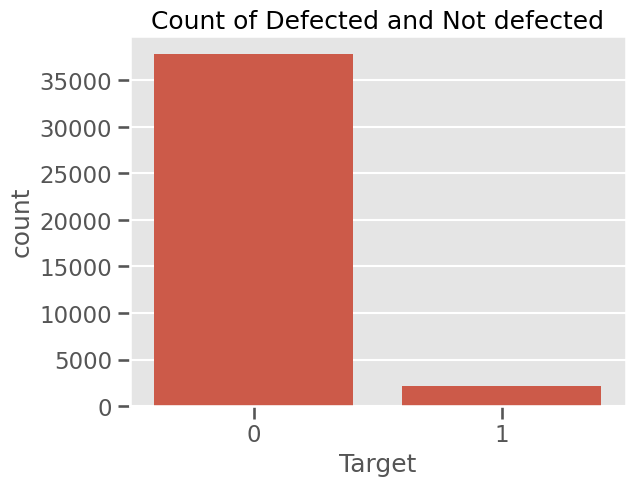

In [13]:
sns.countplot(data = df, x = df['Target'])
plt.title('Count of Defected and Not defected')
plt.show()

In [14]:
df.corr()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
V1,1.000000,0.311101,0.391222,-0.300728,-0.517895,0.174118,0.483199,-0.361436,0.398818,-0.016599,0.290711,-0.143943,0.064569,-0.267593,0.414125,-0.335131,-0.355494,-0.391594,0.125415,-0.341419,-0.394659,0.206557,-0.437075,-0.519623,0.677999,0.224298,0.688550,-0.286215,-0.069354,-0.468472,0.089142,-0.637005,-0.295138,-0.017052,0.139893,-0.115522,-0.351626,0.144054,-0.111893,0.213300,0.072479
V2,0.311101,1.000000,0.092721,0.290143,0.381724,0.239828,0.454494,-0.389522,0.280965,-0.478604,0.158511,-0.165168,-0.387923,-0.853848,0.222739,-0.247667,0.163920,-0.300153,0.122002,-0.587797,-0.064379,-0.092576,-0.183244,0.224300,-0.125173,0.785097,-0.200456,0.039951,0.177203,-0.216078,-0.046404,-0.117384,0.203190,-0.276525,-0.055872,-0.577254,-0.441020,0.659136,-0.346955,0.152297,0.003327
V3,0.391222,0.092721,1.000000,-0.038280,-0.359743,-0.290020,-0.154066,-0.413462,0.233131,0.452450,-0.336655,-0.167947,0.333653,-0.218318,-0.057970,-0.533370,-0.420100,-0.267017,0.396337,-0.041186,-0.657938,-0.200097,-0.787187,-0.273926,0.602591,0.461753,0.507070,-0.416941,-0.451055,-0.612740,0.467978,-0.374823,-0.225050,0.226404,0.495433,0.446601,-0.502409,-0.075966,0.537671,-0.301315,-0.216774
V4,-0.300728,0.290143,-0.038280,1.000000,0.080766,-0.464950,-0.196947,0.031894,0.267918,-0.114090,-0.358272,-0.233195,-0.275850,-0.226714,-0.153622,-0.196730,0.612099,-0.410172,0.598378,0.416198,-0.082313,-0.030355,0.039720,0.513161,-0.273699,0.099307,-0.588885,0.666983,-0.178469,0.128475,-0.383846,0.377565,-0.052081,0.302361,0.336036,-0.562932,-0.347877,0.097623,-0.388277,-0.669144,0.115800
V5,-0.517895,0.381724,-0.359743,0.080766,1.000000,0.161309,-0.082606,0.165439,-0.300693,-0.341557,-0.212147,-0.018610,-0.335849,-0.146548,-0.150061,0.265280,0.325858,0.440994,-0.505856,-0.362060,0.384324,-0.085950,0.455317,0.666024,-0.603128,0.404558,-0.659488,-0.033573,0.094522,0.143519,0.299718,0.621855,0.463762,-0.608584,-0.340907,-0.043175,0.065656,0.174111,-0.215557,0.336695,-0.099787
V6,0.174118,0.239828,-0.290020,-0.464950,0.161309,1.000000,0.215424,-0.558614,0.079961,-0.112544,0.709424,-0.397196,-0.235731,-0.349109,0.149393,-0.083511,-0.453135,0.283007,-0.414138,-0.698463,0.226280,-0.068987,-0.184868,-0.190220,-0.192458,0.151573,0.214242,-0.177282,0.583652,0.147893,-0.111035,-0.287403,0.587465,-0.398895,-0.317627,-0.246856,-0.074552,0.631878,-0.026358,0.422421,-0.005613
V7,0.483199,0.454494,-0.154066,-0.196947,-0.082606,0.215424,1.000000,0.086184,-0.240538,-0.171085,0.533424,0.391527,-0.494822,-0.321754,0.870436,0.396816,0.022358,-0.562813,0.137461,-0.413684,0.468798,-0.276133,-0.054343,-0.211853,0.203613,0.021656,0.293033,0.189301,0.309511,-0.249804,-0.034200,-0.460147,-0.265596,0.233395,-0.437275,-0.278732,-0.013662,0.469194,-0.235634,0.477005,0.240196
V8,-0.361436,-0.389522,-0.413462,0.031894,0.165439,-0.558614,0.086184,1.000000,-0.610453,-0.183876,-0.191100,0.679724,-0.096970,0.546982,0.167587,0.802402,0.511711,-0.018577,-0.154474,0.440619,0.479766,-0.041151,0.719997,0.250362,-0.208331,-0.507043,-0.419162,0.166537,0.063073,0.368604,0.144808,0.475521,-0.244590,0.048586,-0.161296,0.153525,0.529109,-0.616372,-0.346955,0.256939,0.137263
V9,0.398818,0.280965,0.233131,0.267918,-0.300693,0.079961,-0.240538,-0.610453,1.000000,-0.290281,-0.094113,-0.631016,0.390183,-0.235645,-0.390535,-0.754593,-0.037483,-0.051362,0.046708,0.131590,-0.596324,0.318707,-0.344044,-0.391437,0.319184,0.313269,0.176783,-0.092369,-0.243556,-0.287966,-0.457990,-0.373060,-0.147745,-0.092595,0.113588,-0.348559,-0.200651,0.038874,0.004376,-0.313565,0.010995
V10,-0.016599,-0.478604,0.452450,-0.114090,-0.341557,-0.112544,-0.171085,-0.183876,-0.290281,1.000000,-0.152893,-0.122238,0.069783,0.338119,0.086616,-0.116315,-0.515184,-0.148257,0.408359,0.049932,-0.123701,-0.188791,-0.466058,-0.012523,0.282360,-0.214646,0.505889,0.023285,-0.431203,-0.320392,

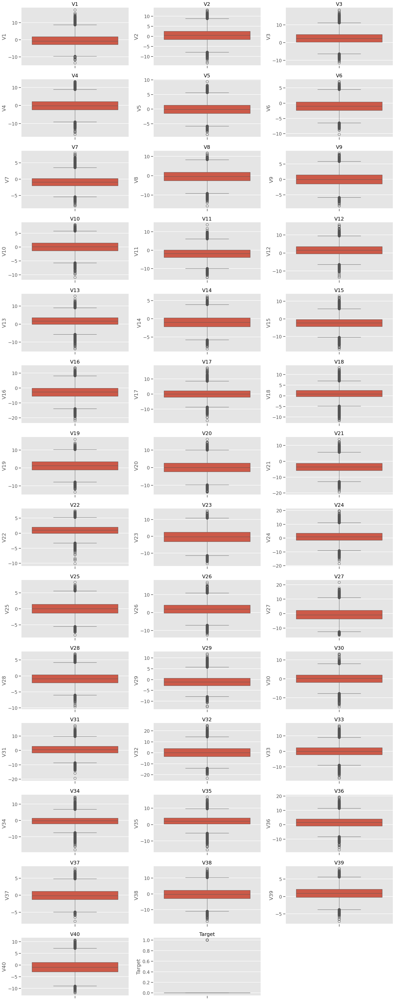

In [15]:
cols = df.columns.tolist()

plt.figure(figsize=(20, 50))
for i, variable in enumerate(cols):
    plt.subplot(14, 3, i + 1)
    sns.boxplot(df[variable])
    plt.tight_layout()
    plt.title(variable)
plt.show()

In [14]:
X = df.iloc[:,0:-1]
y = df['Target']

In [17]:
y.head()

,Target
0,0
1,0
2,0
3,0
4,0


In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [16]:
print(len(X_train))
print(len(X_test))
print(len(y_train))
print(len(y_test))

32000
8000
32000
8000


In [20]:
df1 = df.iloc[:,:20]
df2 = df.iloc[:,20:-1]

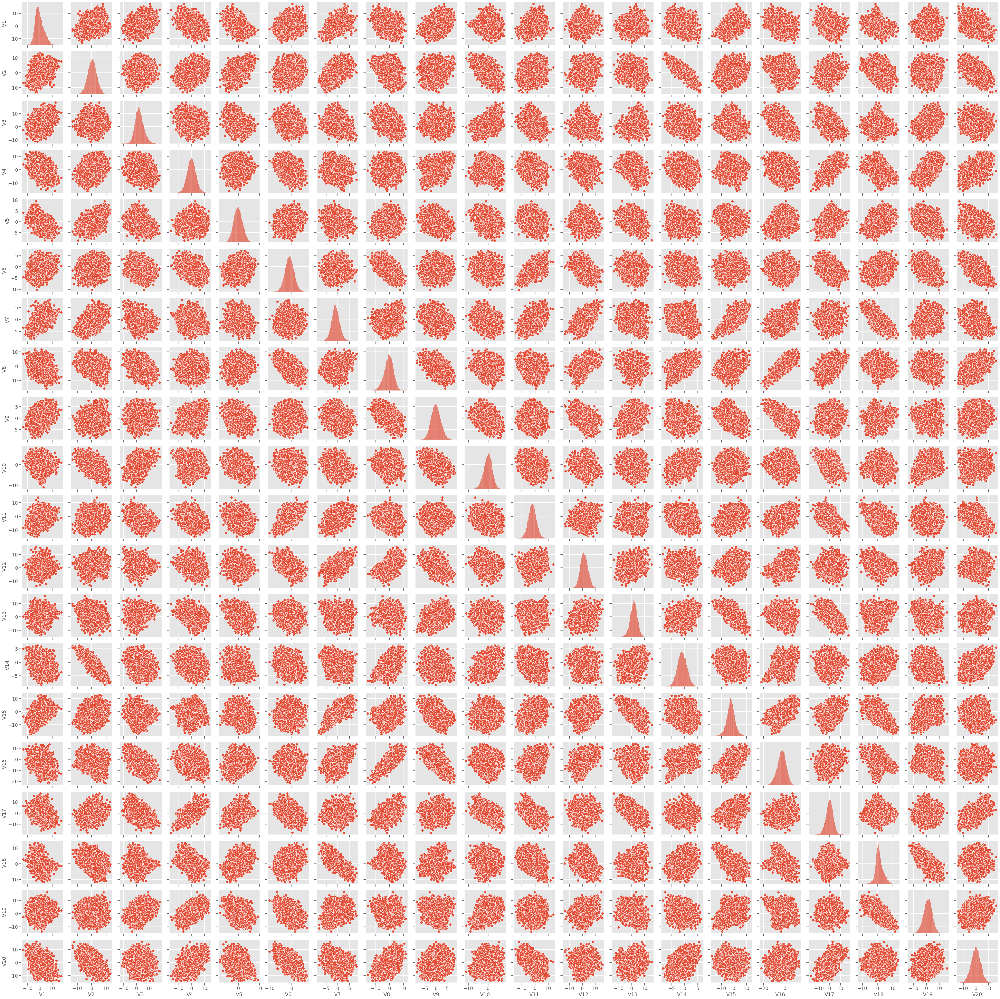

In [21]:
sns.pairplot(data=df1)

In [22]:
def maintanence_cost(model, x, y):
    pred = model.predict(x)
    cm = confusion_matrix(y, model.predict(x))
    TP = cm[1,1]
    FP = cm[0,1]
    FN = cm[1,0]
    cost = (TP*15) + (FP*5) + (FN*40)
    min_cost = (TP+FN)*15
    percent = min_cost / cost



    acc = accuracy_score(y,pred)
    precision = precision_score(y,pred)
    recall = recall_score(y,pred)
    f1 = f1_score(y,pred)

    df_metrics = pd.DataFrame({'Accuracy':acc ,
                               'Precision':precision,
                               'Recall':recall,
                               'F1_score':f1,
                               'Model_Cost':percent}, index=[0])
    return df_metrics

In [23]:
def min_model_cost(y_train,y_pred):
    cm = confusion_matrix(y_train, y_pred)
    TP = cm[1,1]
    FP = cm[0,1]
    FN = cm[1,0]
    cost = (TP*15) + (FP*5) + (FN*40)
    min_cost = (TP+FN)*15
    percent = min_cost / cost
    return percent
scorer = metrics.make_scorer(min_model_cost,greater_is_better=True)

In [24]:
def confusion_matrix_sklearn(model, predictors, target):
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

In [ ]:
names.append('Artificial Neural Network')
names

['Logistic Regression',
 'Decision Tree',
 'Adaptive Boosting',
 'Gradient Boosting',
 'Random Forest',
 'Bagging Classifier',
 'XG Boost',
 'Artificial Neural Network']

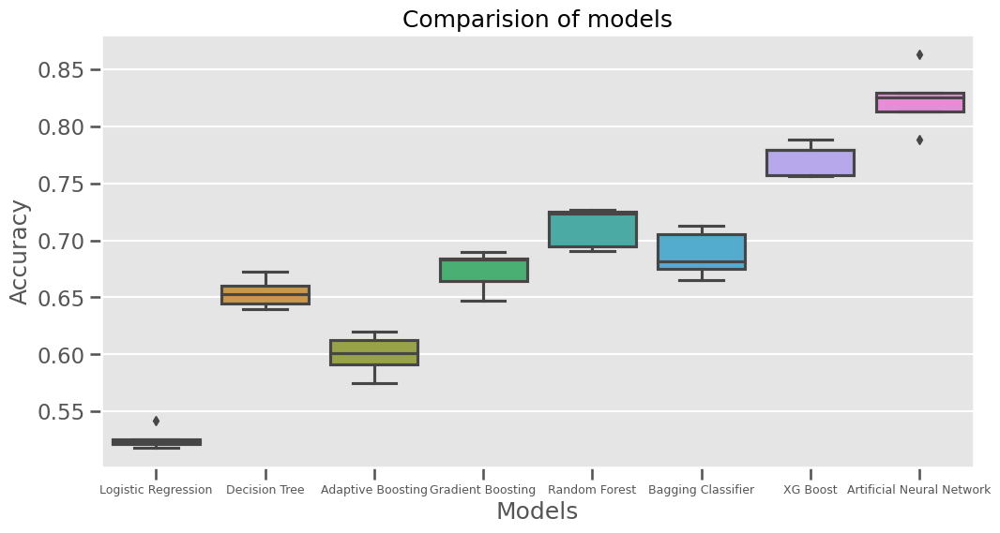

In [ ]:
plt.figure(figsize=(12,6))
sns.boxplot(results,)
plt.title('Comparision of models')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.xticks([0,1,2,3,4,5,6,7], names, fontsize = 9, wrap=True)
plt.show()

In [ ]:
pip install imblearn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.6/235.6 kB 747.2 kB/s eta 0:00:00a 0:00:01
Note: you may need to restart the kernel to use updated packages.


## Model building using over sampling

In [ ]:
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

In [ ]:
print('Failure (1) before over sampling {}, after {}'.format(sum(y_train == 1), sum(y_train_over == 1)))
print('Sucess (0) before over sampling {} after {}'.format(sum(y_train == 0), sum(y_train_over == 0)))

Failure (1) before over sampling 1738, after 30262
Sucess (0) before over sampling 30262 after 30262


In [ ]:
models_over = []

models_over.append(('Logistic Regression',LogisticRegression(random_state=1)))
models_over.append(('Decision Tree',DecisionTreeClassifier(random_state=1)))
models_over.append(('Adaptive Boosting',AdaBoostClassifier(random_state=1)))
models_over.append(('Gradient Boosting',GradientBoostingClassifier(random_state=1)))
models_over.append(('Random Forest',RandomForestClassifier(random_state=1)))
models_over.append(('Bagging Classifier',BaggingClassifier(random_state=1)))
models_over.append(('XG Boost',XGBClassifier(random_state=1)))

results_over = []
names_over = []

print('Classification Results\n')

for name, model in models_over:
    kfold = StratifiedKFold(n_splits=5, random_state=1, shuffle=True)
    cv_score_over = cross_val_score(estimator=model, X=X_train_over,scoring=scorer, y=y_train_over, cv=kfold)
    results_over.append(cv_score_over)
    names_over.append(name)
    print('{}: {}'.format(name,cv_score_over.mean()))

Classification Results

Logistic Regression: 0.7887765017366092
Decision Tree: 0.9377013766409596
Adaptive Boosting: 0.8222018683360656
Gradient Boosting: 0.8607440438503131
Random Forest: 0.9660029027643761
Bagging Classifier: 0.9516704274727056
XG Boost: 0.9697969560921192


In [ ]:
print('Train and Test results\n')

for name, model in models_over:
    model.fit(X_train_over,y_train_over)
    train_score = min_model_cost(y_train_over, model.predict(X_train_over))
    test_score = min_model_cost(y_test, model.predict(X_test))
    print('{} train: {}, test: {}'.format(name,train_score,test_score))

Train and Test results

Logistic Regression train: 0.7886000191099954, test: 0.5081101471142965
Decision Tree train: 1.0, test: 0.6466634661545847
Adaptive Boosting train: 0.8250272628135223, test: 0.6048495734171532
Gradient Boosting train: 0.8643733754796203, test: 0.7441988950276243
Random Forest train: 1.0, test: 0.8340557275541796
Bagging Classifier train: 0.9971881109817446, test: 0.7854227405247813
XG Boost train: 0.9964110500148168, test: 0.8294334975369458


In [ ]:
app_over = np.array([0.88558352402746,
 0.8768267223382046,
 0.872198667474258,
 0.870245757753072,
 0.8750563824988723])
results_over.append(app_over)
results_over

[array([0.78966597, 0.79377432, 0.78491463, 0.78924722, 0.78628037]),
 array([0.94150591, 0.93780992, 0.93070576, 0.93482625, 0.94365904]),
 array([0.82647487, 0.82527273, 0.81168425, 0.82260476, 0.82497274]),
 array([0.86108608, 0.8634202 , 0.85381794, 0.86037146, 0.86502454]),
 array([0.9694575 , 0.96078743, 0.96744806, 0.96472401, 0.96759753]),
 array([0.95137288, 0.95402238, 0.94874608, 0.94988753, 0.95432326]),
 array([0.97299035, 0.9655906 , 0.97075805, 0.97055051, 0.96909528]),
 array([0.88558352, 0.87682672, 0.87219867, 0.87024576, 0.87505638])]

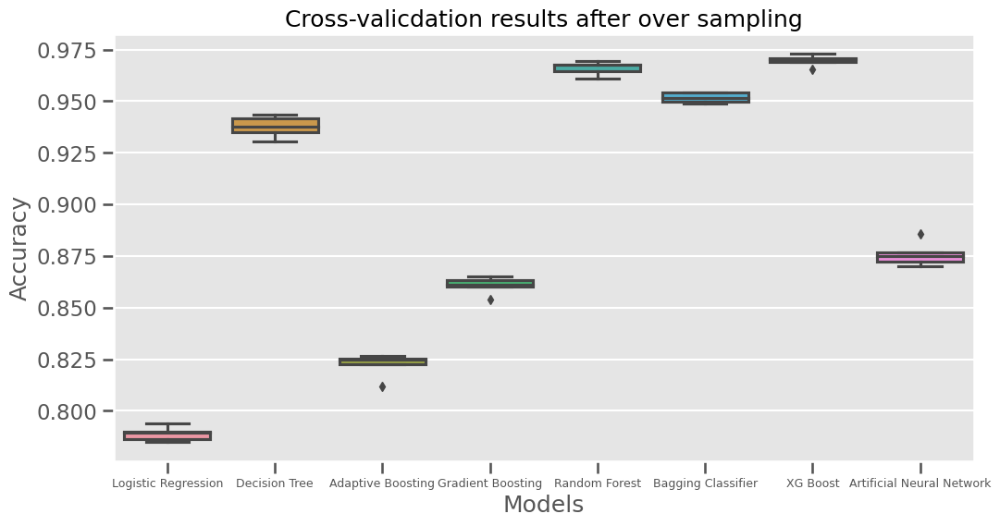

In [ ]:
plt.figure(figsize=(12,6))
sns.boxplot(results_over)
plt.xticks([0,1,2,3,4,5,6,7], names, fontsize=9)
plt.title('Cross-valicdation results after over sampling')
plt.ylabel('Accuracy')
plt.xlabel('Models')
plt.show()

## Model building using undersampling

In [ ]:
rms = RandomUnderSampler(random_state=1, sampling_strategy=1)
X_train_under, y_train_under = rms.fit_resample(X_train,y_train)

In [ ]:
print('Failure (1) before over sampling {}, after {}'.format(sum(y_train == 1), sum(y_train_under == 1)))
print('Sucess (0) before over sampling {} after {}'.format(sum(y_train == 0), sum(y_train_under == 0)))

Failure (1) before over sampling 1738, after 1738
Sucess (0) before over sampling 30262 after 1738


In [ ]:
results_under = []
names_under = []
print('Classification Results\n')

for name, model in models:
    kfold = StratifiedKFold(n_splits=5, random_state=1, shuffle=True)
    cv_score_under = cross_val_score(estimator=model, X=X_train_under,scoring=scorer, y=y_train_under, cv=kfold)
    results_under.append(cv_score_under)
    names_under.append(name)
    print('{}: {}'.format(name,cv_score_under.mean()))

Classification Results

Logistic Regression: 0.7664702330466421
Decision Tree: 0.7686575349784195
Adaptive Boosting: 0.7938683587839942
Gradient Boosting: 0.8244710163858497
Random Forest: 0.8397522882162611
Bagging Classifier: 0.8119293469264927
XG Boost: 0.8445235210048505


In [ ]:
print('Train and Test results\n')

for name, model in models:
    model.fit(X_train_under,y_train_under)
    train_score = min_model_cost(y_train_under, model.predict(X_train_under))
    test_score = min_model_cost(y_test, model.predict(X_test))
    print('{} train: {}, test: {}'.format(name,train_score,test_score))

Train and Test results

Logistic Regression train: 0.7706177948566362, test: 0.5011160714285714
Decision Tree train: 1.0, test: 0.4854054054054054
Adaptive Boosting train: 0.8171133051245886, test: 0.56125
Gradient Boosting train: 0.8664007976071785, test: 0.6946879834966477
Random Forest train: 1.0, test: 0.7649063032367973
Bagging Classifier train: 0.9666295884315906, test: 0.6990140114167099
XG Boost train: 1.0, test: 0.7653409090909091


In [ ]:
app_under = np.array([0.88558352402746,
 0.8768267223382046,
 0.872198667474258,
 0.870245757753072,
 0.8750563824988723])
results_under.append(app_under)
results_under

[array([0.76934414, 0.77168273, 0.77513031, 0.74571429, 0.7704797 ]),
 array([0.75542692, 0.77168273, 0.77919162, 0.75379061, 0.7831958 ]),
 array([0.79090909, 0.79648049, 0.81391712, 0.7704797 , 0.79755539]),
 array([0.82922955, 0.83080607, 0.82422803, 0.80555556, 0.83253589]),
 array([0.8372093 , 0.8546798 , 0.83346677, 0.81626271, 0.85714286]),
 array([0.81118881, 0.81711146, 0.81328125, 0.80307692, 0.81498829]),
 array([0.84466019, 0.85257985, 0.8582028 , 0.815625  , 0.85154976]),
 array([0.88558352, 0.87682672, 0.87219867, 0.87024576, 0.87505638])]

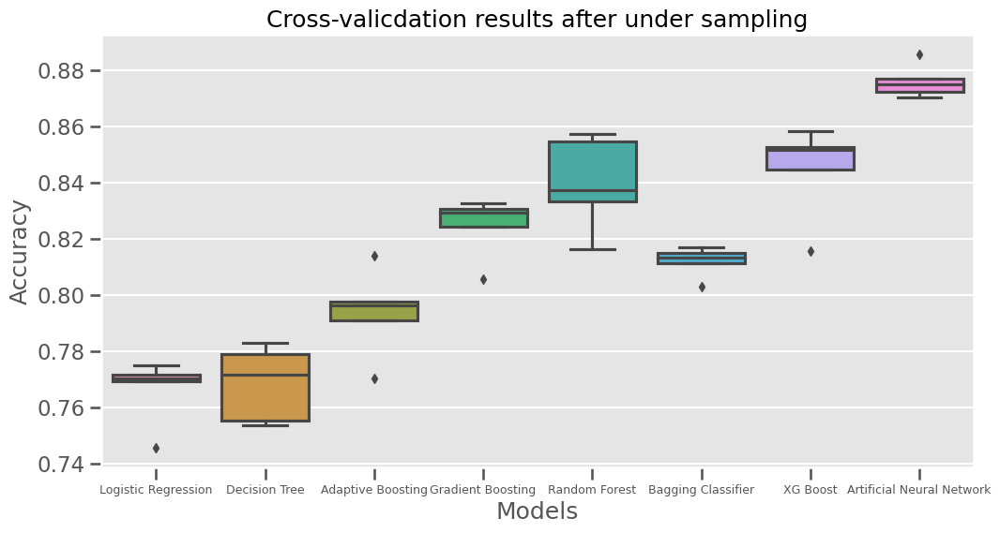

In [ ]:
plt.figure(figsize=(12,6))
sns.boxplot(results_under)
plt.xticks([0,1,2,3,4,5,6,7], names, fontsize=9)
plt.title('Cross-valicdation results after under sampling')
plt.ylabel('Accuracy')
plt.xlabel('Models')
plt.show()

## Hyperparameter tuning

> Add blockquote

> Add blockquote





In [ ]:
param_xgb = {
    'learning_rate': [0.01, 0.1],
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1, 0.2],
    'reg_alpha': [0, 0.01, 0.1],
    'reg_lambda': [0, 0.01, 0.1],
    'scale_pos_weight': [1, 2, 3]
}

early_stopping_rounds = [10, 20, 30]
eval_metric = ['logloss']

In [ ]:
xgb_model = XGBClassifier(random_state = 1, eval_metric = 'logloss')

scorer = metrics.make_scorer(min_model_cost, greater_is_better=True)

randomized_cv_xgb = RandomizedSearchCV(estimator=xgb_model,
                    param_distributions=param_xgb,
                    scoring=scorer,
                    n_iter=20,
                    cv = 4,
                    random_state=1,
                    n_jobs=-1)

randomized_cv_xgb.fit(X_train,y_train)

RandomizedSearchCV(cv=4,
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='logloss',
                                           feature_types=None, gamma=None,
                                           gpu_id=None, grow_policy=None,
                                           importance_type=None,
                                           interaction_constraints=None,
                                           learning...
                   n_iter=20, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.8, 0.9, 1.0],
                                        'gamma': [0, 0.1, 0.2],
                                        'learning_rate': [0.01, 0.1],
                                        'max_depth': [3, 4, 5],
                                        'min_child_weight': [1, 3, 5],
                                        'n_estimators': [100, 200, 300],
                                        'reg_alpha': [0, 0.01, 0.1],
                                        'reg_lambda': [0, 0.01, 0.1],
                                        'scale_pos_weight': [1, 2, 3],
                                        'subsample': [0.8, 0.9, 1.0]},
                   random_state=1, scoring=make_scorer(min_model_cost))

In [ ]:
print('Best score: ',randomized_cv_xgb.best_score_)
print('Best parameters:\n',randomized_cv_xgb.best_params_)

Best score:  0.7823288688989104
Best parameters:
 {'subsample': 1.0, 'scale_pos_weight': 3, 'reg_lambda': 0, 'reg_alpha': 0.01, 'n_estimators': 300, 'min_child_weight': 1, 'max_depth': 4, 'learning_rate': 0.1, 'gamma': 0.1, 'colsample_bytree': 0.9}


In [ ]:
xgb_tune = XGBClassifier(subsample = 1,
                         scale_pos_weight = 3,
                         reg_lambda = 0,
                         reg_alpha = 0.01,
                         n_estimators = 300,
                         min_child_weight = 1,
                         max_depth = 4,
                         learning_rate = 0.1,
                         gamma = 0.1,
                         colsample_bytree = 0.9)

xgb_tune.fit(X_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.9, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.1, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=1, missing=nan, monotone_constraints=None,
              n_estimators=300, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [ ]:
xgb_train_performance = maintanence_cost(xgb_tune, X_train, y_train)
print('Training performance\n')

xgb_train_performance

Training performance



,Accuracy,Precision,Recall,F1_score,Model_Cost
0,0.99775,0.992899,0.965478,0.978996,0.94354


In [ ]:
xgb_test_performance = maintanence_cost(xgb_tune, X_test, y_test)
print('Test performance\n')

xgb_test_performance

Test performance



,Accuracy,Precision,Recall,F1_score,Model_Cost
0,0.99075,0.972292,0.859688,0.91253,0.80514


### Random Forest

In [ ]:
param_rfc = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
    'bootstrap': [True, False]
}

In [ ]:
rfc_model = RandomForestClassifier(random_state=1, oob_score=True, bootstrap=True)

randomized_cv_rfc = RandomizedSearchCV(estimator=rfc_model,
                                       param_distributions=param_rfc,
                                       scoring=scorer,
                                       cv = 5,
                                       n_iter=50,
                                       n_jobs=-1,
                                       random_state=1)

randomized_cv_rfc.fit(X_train,y_train)

/Users/sachinkumar/opt/anaconda3/envs/myenv/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/sachinkumar/opt/anaconda3/envs/myenv/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/sachinkumar/opt/anaconda3/envs/myenv/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

/Users/sachinkumar/opt/anaconda3/envs/myenv/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/sachinkumar/opt/anaconda3/envs/myenv/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/sachinkumar/opt/anaconda3/envs/myenv/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

/Users/sachinkumar/opt/anaconda3/envs/myenv/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/sachinkumar/opt/anaconda3/envs/myenv/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/Users/sachinkumar/opt/anaconda3/envs/myenv/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly 

RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(oob_score=True,
                                                    random_state=1),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [None, 10, 20, 30],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [100, 200, 300]},
                   random_state=1, scoring=make_scorer(min_model_cost))

In [ ]:
print('Best Score: ',randomized_cv_rfc.best_score_)
print('Best Parameters: ',randomized_cv_rfc.best_params_)

Best Score:  0.7157303411012721
Best Parameters:  {'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 30, 'bootstrap': True}


In [ ]:
rfc_tune = RandomForestClassifier(n_estimators=200,
                                  min_samples_split=5,
                                  min_samples_leaf=1,
                                  max_features='auto',
                                  max_depth=30,
                                  bootstrap=True)
rfc_tune.fit(X_train,y_train)

RandomForestClassifier(max_depth=30, max_features='auto', min_samples_split=5,
                       n_estimators=200)

In [ ]:
rfc_train_performance = maintanence_cost(rfc_tune, X_train, y_train)
print('Training performane\n')

(rfc_train_performance)

Training performane



,Accuracy,Precision,Recall,F1_score,Model_Cost
0,0.996406,0.998771,0.934983,0.965825,0.90192


In [ ]:
rfc_test_performance = maintanence_cost(rfc_tune, X_test, y_test)
print('Test Performance\n')

rfc_test_performance

Test Performance



,Accuracy,Precision,Recall,F1_score,Model_Cost
0,0.987375,0.988764,0.783964,0.874534,0.73366


### Model Comparision

In [ ]:
model_train_prformance = pd.concat([xgb_train_performance.T,rfc_train_performance.T], axis = 1)
model_train_prformance.columns = ['XGBoost tuned','Random forest tuned']
print('Model training performance comparision')
model_train_prformance

Model training performance comparision


,XGBoost tuned,Random forest tuned
Accuracy,0.997750,0.996406
Precision,0.992899,0.998771
Recall,0.965478,0.934983
F1_score,0.978996,0.965825
Model_Cost,0.943540,0.901920


In [ ]:
model_test_prformance = pd.concat([xgb_test_performance.T,rfc_test_performance.T], axis = 1)
model_test_prformance.columns = ['XGBoost tuned','Random forest tuned']
print('Model test performance comparision')
model_test_prformance

Model test performance comparision


,XGBoost tuned,Random forest tuned
Accuracy,0.990750,0.987375
Precision,0.972292,0.988764
Recall,0.859688,0.783964
F1_score,0.912530,0.874534
Model_Cost,0.805140,0.733660


## Testing the model with test dataset

In [ ]:
test_df = pd.read_csv('Test.csv')
test_df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,Target
0,-0.613489,-3.819640,2.202302,1.300420,-1.184929,-4.495964,-1.835817,4.722989,1.206140,-0.341909,-5.122874,1.017021,4.818549,3.269001,-2.984330,1.387370,2.032002,-0.511587,-1.023069,7.338733,-2.242244,0.155489,2.053786,-2.772273,1.851369,-1.788696,-0.277282,-1.255143,-3.832886,-1.504542,1.586765,2.291204,-5.411388,0.870073,0.574479,4.157191,1.428093,-10.511342,0.454664,-1.448363,0
1,-0.732692,2.209513,8.083006,7.062533,-1.510459,-3.260527,-3.333773,-3.018543,3.556598,-1.510685,-6.694697,-1.936701,0.141019,-3.471372,-4.233177,-10.416455,5.479431,-0.022955,6.036333,6.603463,-8.319705,0.104421,-6.878574,1.457221,2.109761,3.380861,-4.467338,0.995777,-1.409203,-0.694051,-2.577301,-3.270366,-1.806367,1.797525,5.895108,-1.312278,-0.765156,-1.407807,0.557128,-4.049262,0
2,0.389608,-0.512341,0.527053,-2.576776,-1.016766,2.235112,-0.441301,-4.405744,-0.332869,1.966794,1.796544,0.410490,0.638328,-1.389600,-1.883410,-5.017922,-3.827238,2.418060,1.762285,-3.242297,-3.192960,1.857454,-1.707954,0.633444,-0.587898,0.083683,3.013935,-0.182309,0.223917,0.865228,-1.782158,-2.474936,2.493582,0.315165,2.059288,0.683859,-0.485452,5.128350,1.720744,-1.488235,0
3,3.412089,1.153345,2.114167,-2.275466,0.087845,-0.009578,0.514235,-1.370917,1.862913,-0.031132,-0.413716,-1.566748,3.183819,0.864431,-0.417157,-0.995751,-3.086726,-0.648430,-2.731857,-2.056434,-1.620290,-0.091157,-1.511600,-3.891854,1.645565,3.146990,4.441590,-2.523508,-2.434027,-4.086404,2.828084,-2.496609,-1.776174,-1.712035,-1.506021,2.242186,-0.657637,-1.861584,0.845768,0.857333,0
4,-0.874861,-0.640632,4.084202,-1.590454,0.525855,-1.957592,-0.695367,1.347309,-1.732348,0.466500,-4.928214,3.565070,-0.449329,-0.656246,-0.166537,-1.630207,2.291865,2.396492,0.601278,1.793534,-2.120238,0.481968,-0.840707,1.790197,1.874395,0.363930,-0.169063,-0.483832,-2.118982,-2.156586,2.907291,-1.318888,-2.997464,0.459664,0.619774,5.631504,1.323512,-1.752154,1.808302,1.675748,0


In [ ]:
test_df.shape

(10000, 41)

In [ ]:
test_df.isna().sum()

V1        11
V2         7
V3         0
V4         0
V5         0
V6         0
V7         0
V8         0
V9         0
V10        0
V11        0
V12        0
V13        0
V14        0
V15        0
V16        0
V17        0
V18        0
V19        0
V20        0
V21        0
V22        0
V23        0
V24        0
V25        0
V26        0
V27        0
V28        0
V29        0
V30        0
V31        0
V32        0
V33        0
V34        0
V35        0
V36        0
V37        0
V38        0
V39        0
V40        0
Target     0
dtype: int64

In [ ]:
test_v1_mean = test_df['V1'].mean()
test_v2_mean = test_df['V2'].mean()

In [ ]:
test_df['V1'].fillna(test_v1_mean,inplace=True)
test_df['V2'].fillna(test_v2_mean,inplace=True)

In [ ]:
test_df.isna().sum()

V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
V29       0
V30       0
V31       0
V32       0
V33       0
V34       0
V35       0
V36       0
V37       0
V38       0
V39       0
V40       0
Target    0
dtype: int64

In [ ]:
X_test_df = test_df.iloc[:,:-1]
y_test_df = test_df['Target']

In [ ]:
print(X_test_df.shape)
print(y_test_df.shape)

(10000, 40)
(10000,)


In [ ]:
min_model_cost(y_test_df, xgb_tune.predict(X_test_df))

0.7788324632178453

In [ ]:
xgb_test_df_performace = maintanence_cost(xgb_tune, X_test_df, y_test_df)
xgb_test_df_performace

,Accuracy,Precision,Recall,F1_score,Model_Cost
0,0.9894,0.966173,0.835466,0.896078,0.778832


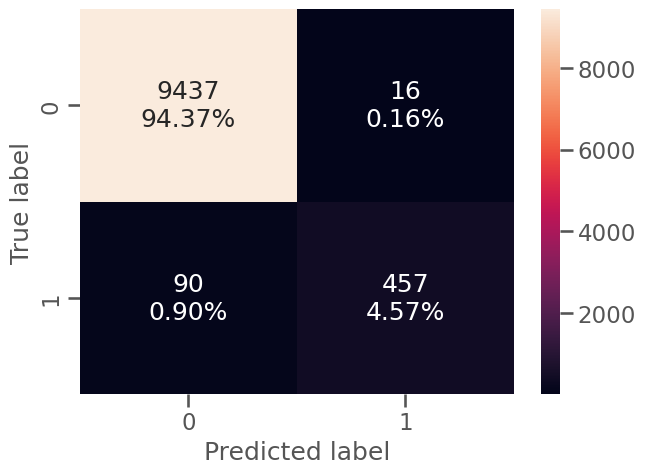

In [ ]:
confusion_matrix_sklearn(xgb_tune, X_test_df, y_test_df)

In [ ]:
feature_name = X.columns
important_feat = xgb_tune.feature_importances_
indices = np.argsort(important_feat)

In [ ]:
print(indices.shape)
print(important_feat.shape)

(40,)
(40,)


In [ ]:
feature_impo_df = pd.DataFrame(data=[indices, important_feat]).T
feature_impo_df.columns = ['Index', 'Importance']

In [ ]:
feature_impo_df = feature_impo_df.sort_values('Importance', ascending=False)
feature_impo_df.head()

,Index,Importance
17,1.0,0.183031
35,13.0,0.074088
2,30.0,0.060718
20,12.0,0.056050
13,22.0,0.047828


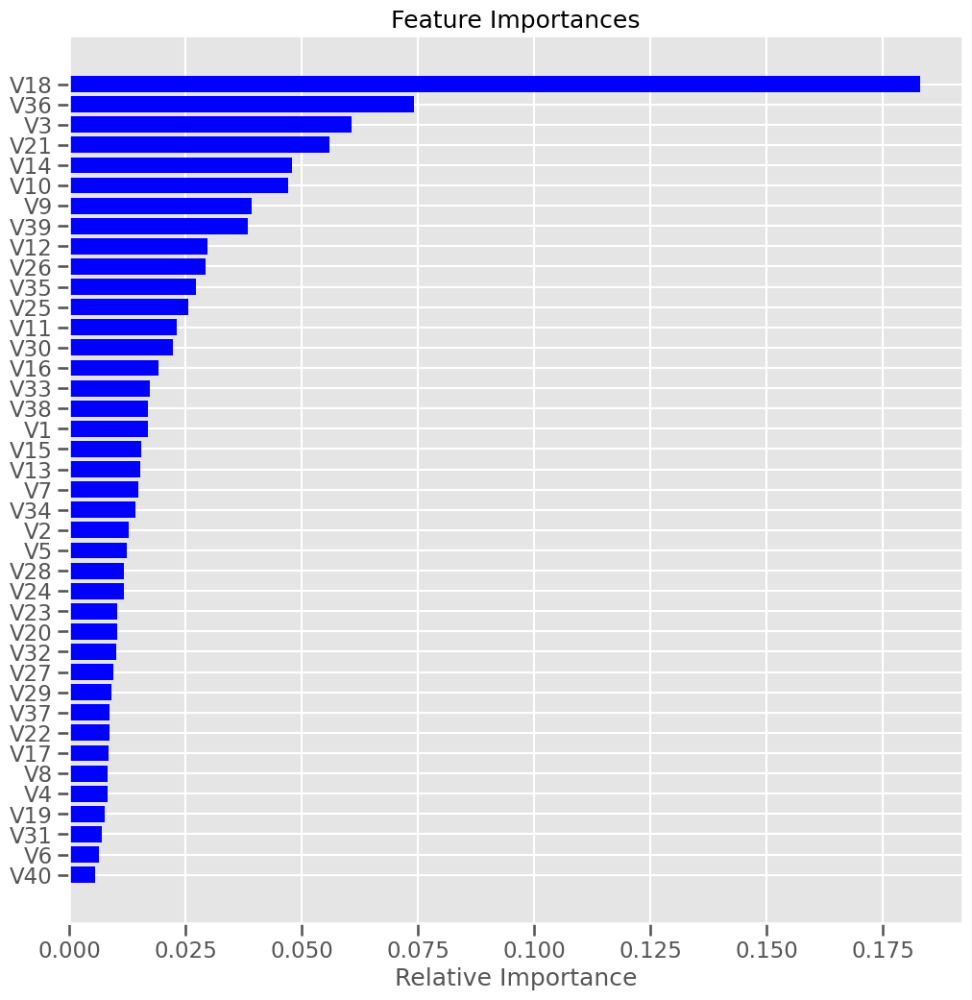

In [ ]:
feature_names = X.columns
importances = xgb_tune.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="blue", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

## Finding Optimal Threshold

In [ ]:
pred = []
for model in [xgb_tune,rfc_tune]:
    pred.append(pd.Series(model.predict_proba(X_test_df)[:,1]))
final_prediction = pd.concat(pred,axis = 1).mean(axis = 1)

In [ ]:
pd.concat(pred, axis = 1).head()

,0,1
0,0.009101,0.005400
1,0.003008,0.011458
2,0.018687,0.007468
3,0.007811,0.005210
4,0.007596,0.005156


In [ ]:
final_prediction[:5]

0    0.007251
1    0.007233
2    0.013078
3    0.006510
4    0.006376
dtype: float64

In [ ]:
fpr, tpr, thresholds = roc_curve(y_test_df,final_prediction)

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_ls = []
for thres in thresholds:
    y_pred = np.where(final_prediction>thres,1,0)
    accuracy_ls.append(accuracy_score(y_test_df, y_pred, normalize=True))

accuracy_ls = pd.concat([pd.Series(thresholds), pd.Series(accuracy_ls)],
                        axis=1)
accuracy_ls.columns = ['thresholds', 'accuracy']
accuracy_ls.sort_values(by='accuracy', ascending=False, inplace=True)
accuracy_ls.head()

,thresholds,accuracy
19,0.443831,0.9897
20,0.438280,0.9897
18,0.451915,0.9897
17,0.463620,0.9896
23,0.402992,0.9896


## Pipeline to build the final model

In [ ]:
model_puipeline = Pipeline(steps= [
    ('imputer', SimpleImputer(strategy='mean')),
    ('XGB', XGBClassifier(subsample = 1,
                         scale_pos_weight = 3,
                         reg_lambda = 0,
                         reg_alpha = 0.01,
                         n_estimators = 300,
                         min_child_weight = 1,
                         max_depth = 4,
                         learning_rate = 0.1,
                         gamma = 0.1,
                         colsample_bytree = 0.9))
])
model_puipeline.fit(X,y)

Pipeline(steps=[('imputer', SimpleImputer()),
                ('XGB',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=0.9, early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=0.1, gpu_id=None,
                               grow_policy=None, importance_type=None,
                               interaction_constraints=None, learning_rate=0.1,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=4, max_leaves=None, min_child_weight=1,
                               missing=nan, monotone_constraints=None,
                               n_estimators=300, n_jobs=None,
                               num_parallel_tree=None, predictor=None,
                               random_state=None, ...))])

In [ ]:
min_model_cost(y_test_df, model_puipeline.predict(X_test_df))

0.7825464949928469

In [ ]:
custom_threshold = 0.432970
y_pred_custom = (model_puipeline.predict_proba(X_test_df)[:,1] >= custom_threshold).astype(int)

In [ ]:
print('Accuracy after changing the threshold')
min_model_cost(y_test_df,y_pred_custom)

Accuracy after changing the threshold


0.7973760932944607

In [ ]:
maintanence_cost(model_puipeline, X_test_df, y_test_df)

,Accuracy,Precision,Recall,F1_score,Model_Cost
0,0.9896,0.966316,0.839122,0.898239,0.782546


In [ ]:
y_pred_custom_rfc = (rfc_tune.predict_proba(X_test_df)[:,1] >= custom_threshold).astype(int)
print('Metrics of Random forest')
print('Accuracy: ',accuracy_score(y_test_df, y_pred_custom_rfc))
print('Precision: ', precision_score(y_test_df, y_pred_custom_rfc))
print('Recall: ', recall_score(y_test_df, y_pred_custom_rfc))
print('F1 score: ', f1_score(y_test_df, y_pred_custom_rfc))
print('Model cost: ', min_model_cost(y_test_df, y_pred_custom_rfc))

Metrics of Random forest
Accuracy:  0.9878
Precision:  0.9775280898876404
Recall:  0.7952468007312614
F1 score:  0.877016129032258
Model cost:  0.7421981004070556


In [ ]:
y_pred_custom_xgb = (model_puipeline.predict_proba(X_test_df)[:,1] >= custom_threshold).astype(int)
print('Metrics of XGBoost')
print('Accuracy: ',accuracy_score(y_test_df, y_pred_custom_xgb))
print('Precision: ', precision_score(y_test_df, y_pred_custom_xgb))
print('Recall: ', recall_score(y_test_df, y_pred_custom_xgb))
print('F1 score: ', f1_score(y_test_df, y_pred_custom_xgb))
print('Model cost: ', min_model_cost(y_test_df, y_pred_custom_xgb))

Metrics of XGBoost
Accuracy:  0.9899
Precision:  0.9551020408163265
Recall:  0.8555758683729433
F1 score:  0.9026036644165863
Model cost:  0.7973760932944607
